In [1]:
! pip install ModelAuto

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import ModelAuto as ma
import seaborn as sns
import matplotlib.pyplot as plt
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/life-expectancy-who/Life Expectancy Data.csv


In [3]:
Life_Expectancy_Data = pd.read_csv("/kaggle/input/life-expectancy-who/Life Expectancy Data.csv")
data = Life_Expectancy_Data.copy()


In [4]:
data.head(10)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
5,Afghanistan,2010,Developing,58.8,279.0,74,0.01,79.679367,66.0,1989,...,66.0,9.20,66.0,0.1,553.328940,2883167.0,18.4,18.4,0.448,9.2
6,Afghanistan,2009,Developing,58.6,281.0,77,0.01,56.762217,63.0,2861,...,63.0,9.42,63.0,0.1,445.893298,284331.0,18.6,18.7,0.434,8.9
7,Afghanistan,2008,Developing,58.1,287.0,80,0.03,25.873925,64.0,1599,...,64.0,8.33,64.0,0.1,373.361116,2729431.0,18.8,18.9,0.433,8.7
8,Afghanistan,2007,Developing,57.5,295.0,82,0.02,10.910156,63.0,1141,...,63.0,6.73,63.0,0.1,369.835796,26616792.0,19.0,19.1,0.415,8.4
9,Afghanistan,2006,Developing,57.3,295.0,84,0.03,17.171518,64.0,1990,...,58.0,7.43,58.0,0.1,272.563770,2589345.0,19.2,19.3,0.405,8.1


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

Analysing NaN values

In [6]:
data.isna().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

In [7]:
#We can see nan in tht target variable itself , lets analyse that
data['Life expectancy '].isna().sum()

10

Let's see the countries Whose Life Expectancy is not given

In [8]:
nan_country_names = data[data['Life expectancy '].isna()]['Country']
nan_country_names.value_counts()

Cook Islands             1
Dominica                 1
Marshall Islands         1
Monaco                   1
Nauru                    1
Niue                     1
Palau                    1
Saint Kitts and Nevis    1
San Marino               1
Tuvalu                   1
Name: Country, dtype: int64

In [9]:
[data[data['Country']==cou] for cou in nan_country_names]

[          Country  Year      Status  Life expectancy   Adult Mortality  \
 624  Cook Islands  2013  Developing               NaN              NaN   
 
      infant deaths  Alcohol  percentage expenditure  Hepatitis B  Measles   \
 624              0     0.01                     0.0         98.0         0   
 
      ...  Polio  Total expenditure  Diphtheria    HIV/AIDS  GDP  Population  \
 624  ...   98.0               3.58         98.0        0.1  NaN         NaN   
 
       thinness  1-19 years   thinness 5-9 years  \
 624                    0.1                  0.1   
 
      Income composition of resources  Schooling  
 624                              NaN        NaN  
 
 [1 rows x 22 columns],
       Country  Year      Status  Life expectancy   Adult Mortality  \
 769  Dominica  2013  Developing               NaN              NaN   
 
      infant deaths  Alcohol  percentage expenditure  Hepatitis B  Measles   \
 769              0     0.01               11.419555         96.0    

As we can see that Only one data point or row is present for these countries and that too with lots of Nan in them hence it would be safe to remove these Features

In [10]:
ind_to_romove = [data[data['Country']==cou].index[0] for cou in nan_country_names]
data = data.drop(ind_to_romove,axis=0).reset_index(drop=True)

In [11]:
data.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


#### Filling the NaN values with the Median taken from data points of there respective countries

In [12]:
country_list = data.Country.unique()
fill_list = data.columns[3:]#['Life_Expectancy','Adult_Mortality','Alcohol','HepatitisB','BMI','Polio','Tot_Exp','Diphtheria','GDP','Population','thinness_1to19_years','thinness_5to9_years','Income_Comp_Of_Resources','Schooling']

In [13]:
country_list = data.Country.unique()
for feat in fill_list:
    new = []
    i=0
    for i in range(len(data[feat])):
        val = data[feat].iloc[i]
        if pd.isna(val):
            cou = data[data.index==i].Country.values[0]
            mead = data[data.Country == cou][feat].median()
            if pd.isna(mead):
                mead = data[feat].median() 
            data[feat].iloc[i] = mead
           

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [14]:
data.isna().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
 BMI                               0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
Population                         0
 thinness  1-19 years              0
 thinness 5-9 years                0
Income composition of resources    0
Schooling                          0
dtype: int64

# OutLiers

In [15]:
col_dict = {data.columns[3+i]:i+1 for i in range(len(data.columns[3:])) }
col_dict

{'Life expectancy ': 1,
 'Adult Mortality': 2,
 'infant deaths': 3,
 'Alcohol': 4,
 'percentage expenditure': 5,
 'Hepatitis B': 6,
 'Measles ': 7,
 ' BMI ': 8,
 'under-five deaths ': 9,
 'Polio': 10,
 'Total expenditure': 11,
 'Diphtheria ': 12,
 ' HIV/AIDS': 13,
 'GDP': 14,
 'Population': 15,
 ' thinness  1-19 years': 16,
 ' thinness 5-9 years': 17,
 'Income composition of resources': 18,
 'Schooling': 19}

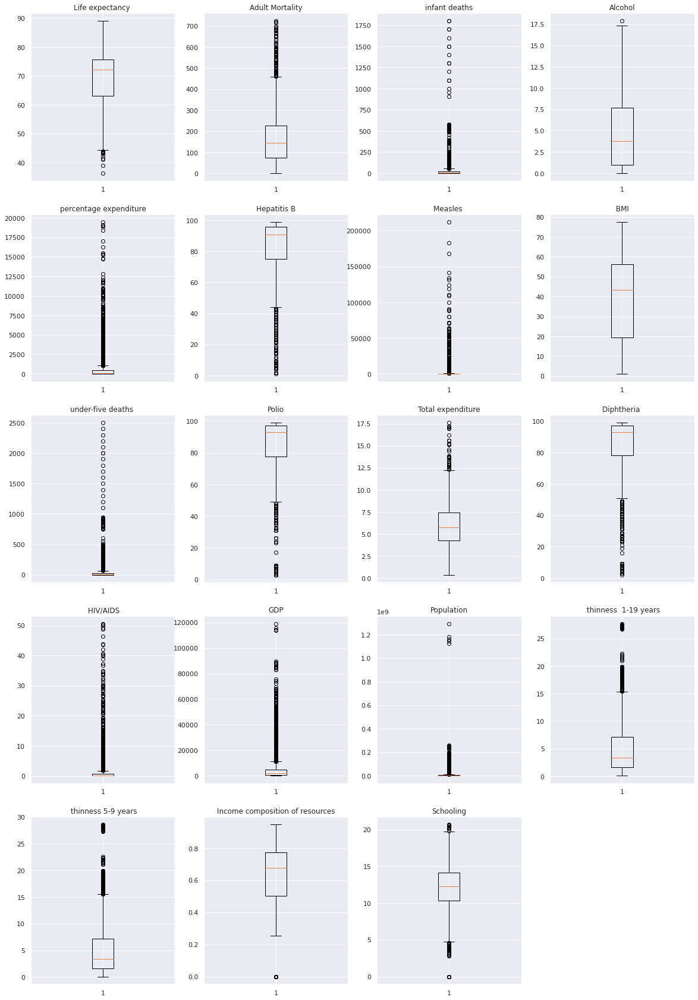

In [16]:
plt.figure(figsize=(20,30))

for variable,i in col_dict.items():
                     plt.subplot(5,4,i)
                     plt.boxplot(data[variable],whis=1.5)
                     plt.title(variable)

plt.show()

#### Let's plot the frap to analyse the outliers in detail

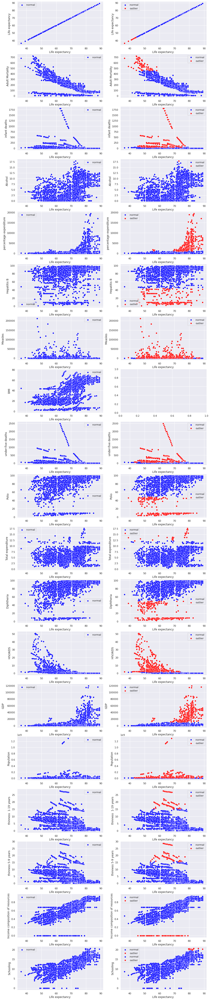

In [17]:
fig,axe = plt.subplots(len(col_dict),2,figsize=(15,80))
c = 0
for variable in col_dict.keys():
    q75, q25 = np.percentile(data[variable], [75 ,25])
    iqr = q75 - q25
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    lmax = len(data[data[variable]>max_val])
    lmin = len(data[data[variable]<min_val])
    sns.scatterplot(ax=axe[c][0],x=data['Life expectancy '],y=data[variable],color='blue',label='normal')
        
    if lmin!=0:
        sns.scatterplot(ax=axe[c][1],x=data[data[variable]>min_val]['Life expectancy '],y=data[data[variable]>min_val][variable],color='blue',label='normal')
        sns.scatterplot(ax=axe[c][1],x=data[data[variable]<=min_val]['Life expectancy '],y=data[data[variable]<=min_val][variable],color='red',label='outlier')
    if lmax !=0:
        sns.scatterplot(ax=axe[c][1],x=data[data[variable]<max_val]['Life expectancy '],y=data[data[variable]<max_val][variable],color='blue',label='normal')
        sns.scatterplot(ax=axe[c][1],x=data[data[variable]>=max_val]['Life expectancy '],y=data[data[variable]>=max_val][variable],color='red',label='outlier')
    plt.legend()
    c=c+1

In [18]:
d3 = data.copy()

#### Removing Outliers

In [19]:
def fun(x,min_val,max_val):
    if x<min_val:
        return min_val
    elif x>max_val:
        return max_val
    else:
        return x

for variable in col_dict.keys():
    q75, q25 = np.percentile(data[variable], [75 ,25])
    iqr = q75 - q25
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    data[variable] = data[variable].apply(lambda x:fun(x,min_val,max_val))

# EDA

In [20]:
# Calculating Avg Life Expect.. Per Year
avg_life = [data[data['Year']==year]['Life expectancy '].mean() for year in data.Year.value_counts().keys()]

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Trend for Life Expectency wrt Year')

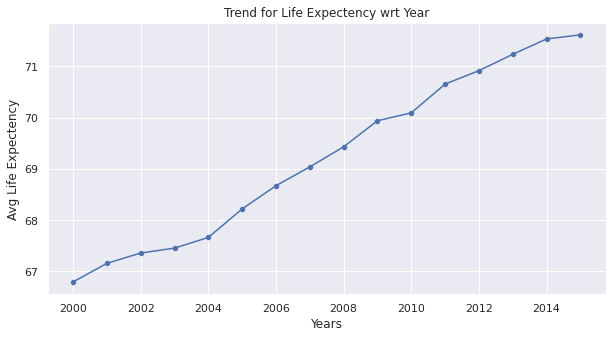

In [21]:
fig = plt.figure(figsize=(10,5))
sns.scatterplot(list(data.Year.value_counts().keys()),avg_life)
sns.lineplot(list(data.Year.value_counts().keys()),avg_life)
plt.ylabel('Avg Life Expectency')
plt.xlabel('Years')
plt.title('Trend for Life Expectency wrt Year')

#### So we can see a very natural conclusion that with the increase in Medical Science avg lie expectancy also increases

## Relationship of Status with Life Expectancy

<AxesSubplot:xlabel='Status', ylabel='Life expectancy '>

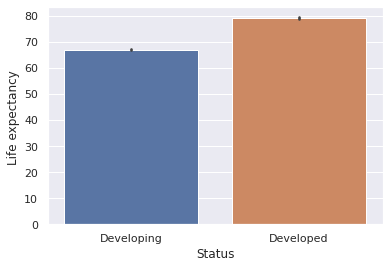

In [22]:
sns.barplot(x=data.Status,y=data['Life expectancy '])

## Relationship of Country with Life Expectancy (Latest Life Expectency)

In [23]:
X = list(data.Country.value_counts().keys())#[:20]
avg_life_country = [data[data['Country']==year]['Life expectancy '].max() for year in X]

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:>

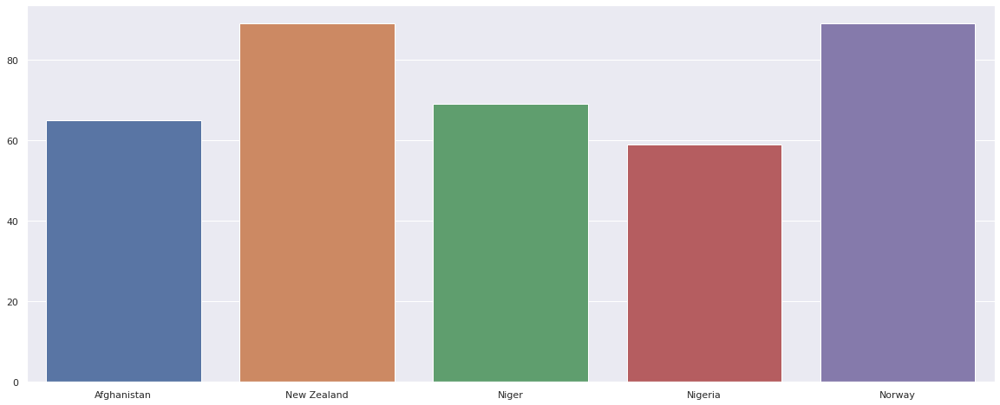

In [24]:
fig = plt.figure(figsize=(20,8))
sns.barplot(X[:5],y=avg_life_country[:5])

#### Variation in Life Expectancy of Devloped Countries

In [25]:
data[data['Status']=='Developed']['Life expectancy '].var()

15.452304572835123

#### Variance : 15.45

Text(0.5, 1.0, 'Variance in Life Expectency of Devloped Countries')

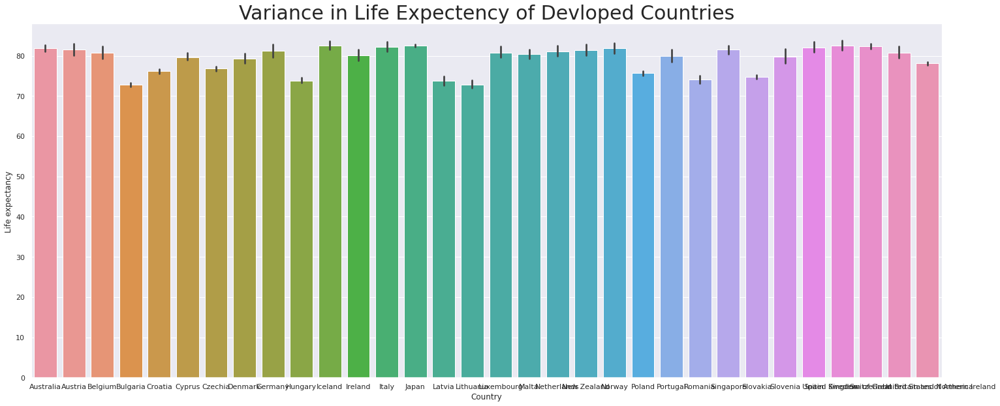

In [26]:
fig = plt.figure(figsize=(25,10))
sns.barplot(data=data[data['Status']=='Developed'],x='Country',y='Life expectancy ')
plt.title('Variance in Life Expectency of Devloped Countries',fontdict={'fontsize':30})

#### Variation in Life Expectancy of Devloping Countries

In [27]:
data[data['Status']=='Developing']['Life expectancy '].var()

80.60350107461643

Text(0.5, 1.0, 'Variance in Life Expectency of Devloping Countries')

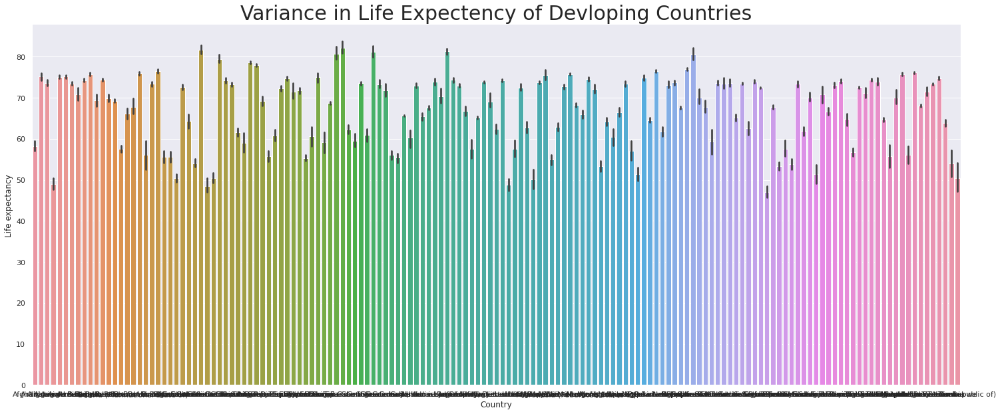

In [28]:
developing = data[data['Status']=='Developing']
fig = plt.figure(figsize=(25,10))
sns.barplot(data=developing,x='Country',y='Life expectancy ')
plt.title('Variance in Life Expectency of Devloping Countries',fontdict={'fontsize':30})

<h3>
From the above graphs It is quite clear that <br>
For <strong> Devloped Countries </strong> the <strong> Variance is quite low </strong>,<br> But
since there is <strong> a large variance </strong> in <strong> Devloping countries <br>
</strong> we cannot Perform Binning on these features.
</h3>

## Relationship between Life Expectancy and Mortality, Infant Death

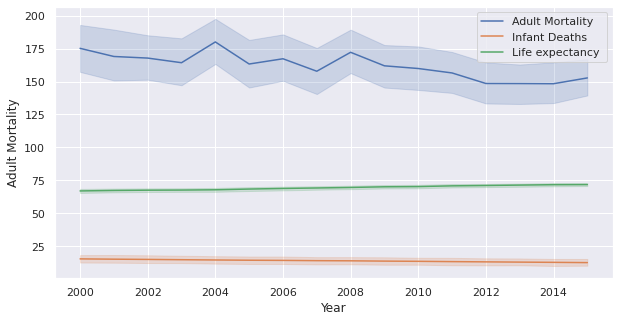

In [29]:
fig = plt.figure(figsize=(10,5))
sns.lineplot(data=data,x='Year',y='Adult Mortality',label = 'Adult Mortality')
sns.lineplot(data=data,x='Year',y='infant deaths',label = 'Infant Deaths')
sns.lineplot(data=data,x='Year',y='Life expectancy ',label = 'Life expectancy ')
plt.legend()

<strong>It is quite clear that with years Mortality and Infant Deaths Reduces and <br> hence these explaines why Life expectancy increases with time </strong>

In [30]:
data.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

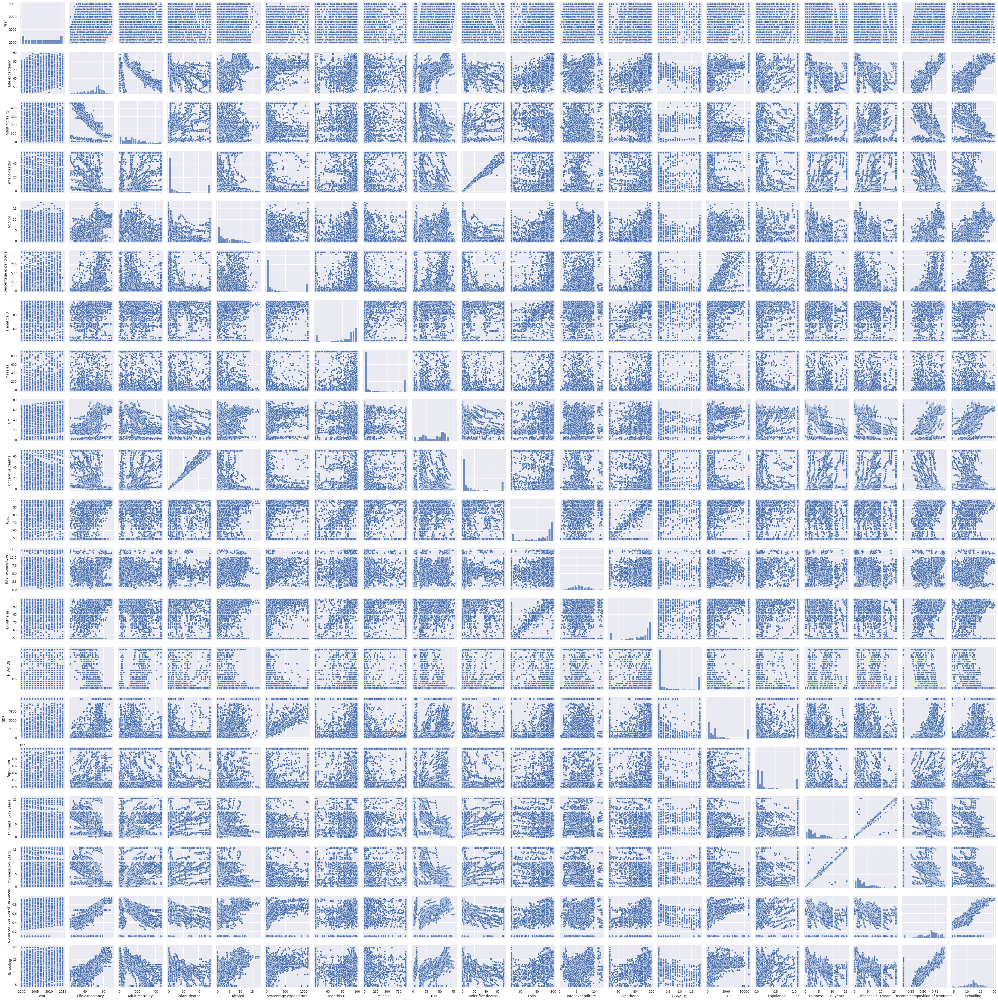

In [31]:
sns.pairplot(data.iloc[3:])

## Let's see how are the Numerical Columns related with Life Expectancy

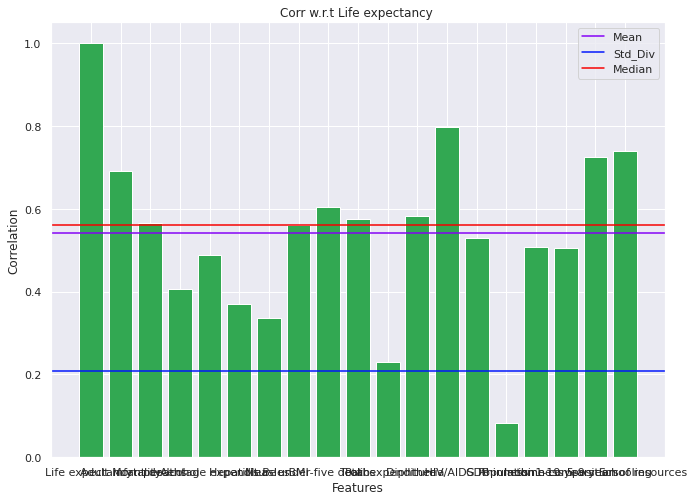



    Mean       : 0.5421428759486557
    Median     : 0.5597552689702707
    Sta_Div    : 0.20828794686837943
  
    


,Columns,CORR
0,Life expectancy,1.000000
1,Adult Mortality,-0.691429
2,infant deaths,-0.566844
3,Alcohol,0.406666
4,percentage expenditure,0.488666
5,Hepatitis B,0.369544
6,Measles,-0.336540
7,BMI,0.559755
8,under-five deaths,-0.603891
9,Polio,0.576158


In [32]:
ma.FeatureSelection.Draw_Corr_map(data.iloc[:,3:],target_index=0)

### Lets Choose all the Features having Corelation above 0.4

In [33]:
feat = ma.FeatureSelection.Corrilation_selection(data.iloc[:,3:],target_index=0,Minimum_Corr=0.4)

Feature Analysing...
Selected Features :  ['Adult Mortality', 'infant deaths', 'Alcohol', 'percentage expenditure', ' BMI ', 'under-five deaths ', 'Polio', 'Diphtheria ', ' HIV/AIDS', 'GDP', ' thinness  1-19 years', ' thinness 5-9 years', 'Income composition of resources', 'Schooling']

No of Features Selected :  14


In [34]:
data.iloc[:,3:].shape

(2928, 19)

### So out of 19 Numerical Features we are have selected 14 Features

In [35]:
# Concatinating Numerical Features with Catagorical Features
data3 = pd.concat([data.iloc[:,:3],feat],axis = 1)

In [36]:
data3.head()

,Country,Year,Status,Adult Mortality,infant deaths,Alcohol,percentage expenditure,BMI,under-five deaths,Polio,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,263.0,55.0,0.01,71.279624,19.1,70.0,48.875,65.0,0.1,584.259210,15.35,15.6,0.479,10.1
1,Afghanistan,2014,Developing,271.0,55.0,0.01,73.523582,18.6,70.0,58.000,62.0,0.1,612.696514,15.35,15.6,0.476,10.0
2,Afghanistan,2013,Developing,268.0,55.0,0.01,73.219243,18.1,70.0,62.000,64.0,0.1,631.744976,15.35,15.6,0.470,9.9
3,Afghanistan,2012,Developing,272.0,55.0,0.01,78.184215,17.6,70.0,67.000,67.0,0.1,669.959000,15.35,15.6,0.463,9.8
4,Afghanistan,2011,Developing,275.0,55.0,0.01,7.097109,17.2,70.0,68.000,68.0,0.1,63.537231,15.35,15.6,0.454,9.5


In [37]:
data2 = pd.concat([data.iloc[:,:3],feat],axis = 1)

In [38]:
data2 = ma.handel_standardization(data2)
data2 = ma.handel_Catagorical(data2)

In [39]:
data2.head()

,Year,Adult Mortality,infant deaths,Alcohol,percentage expenditure,BMI,under-five deaths,Polio,Diphtheria,HIV/AIDS,...,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe,Developing
0,1.000000,0.572052,1.0,0.0,0.064844,0.236292,1.0,0.000000,0.313131,0.0,...,0,0,0,0,0,0,0,0,0,1
1,0.933333,0.589520,1.0,0.0,0.066885,0.229765,1.0,0.182045,0.252525,0.0,...,0,0,0,0,0,0,0,0,0,1
2,0.866667,0.582969,1.0,0.0,0.066608,0.223238,1.0,0.261845,0.292929,0.0,...,0,0,0,0,0,0,0,0,0,1
3,0.800000,0.591703,1.0,0.0,0.071125,0.216710,1.0,0.361596,0.353535,0.0,...,0,0,0,0,0,0,0,0,0,1
4,0.733333,0.598253,1.0,0.0,0.006456,0.211488,1.0,0.381546,0.373737,0.0,...,0,0,0,0,0,0,0,0,0,1


In [40]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

### Spliting the data

In [41]:
Y = data['Life expectancy ']
X_train, X_test, y_train, y_test = train_test_split(dd, Y, test_size=0.30)

NameError: name 'dd' is not defined

## Linear Regression Model

In [ ]:
Linear_model= LinearRegression()
Linear_model.fit(X_train,y_train)
pred = Linear_model.predict(X_test)

In [ ]:
linReg_on_train = Linear_model.score(X_train,y_train)
linReg_on_test = r2_score(pred,y_test)

## Random Forest

In [ ]:
rfc = RandomForestRegressor()
rfc.fit(X_train,y_train)

In [ ]:
Train_score_RandForest = rfc.score(X_train,y_train)
Test_score_RandForest = rfc.score(X_test,y_test)

In [ ]:
round(Train_score_RandForest*100),round(Test_score_RandForest*100)

In [ ]:
round(linReg_on_train*100),round(linReg_on_test*100)

<h1>
    1. Accuracy(approx) on Train data : Random Forest 99, Linear Regresion 96<br>
    2. Accuracy(approx) on Test data : Random Forest 95, Linear Regresion 95

</h1>

## The Above Observation Shows a clear Signs of Overfitting in Random Forest hence we have selected **Linear Regresion Model** as our Final Model